# Using Ensemble Forecasts for Extreme Weather Early Warning Systems

In this notebook, we are showing how to use MetNO Harmonie Ensemble Forecast. Example is based on a storm that happened on 27th of October 2019, in Estonia and it was poorly forecasted and warnings that were put out, were not strong enough. 

_If you have questions or comments, join the Planet OS Slack community to chat with our development team. For general information on usage of IPython/Jupyter and Matplotlib, please refer to their corresponding documentation. https://ipython.org/ and http://matplotlib.org/_

__This Notebook is running on Python3.__

In [1]:
%matplotlib notebook
from API_client.python.datahub import datahub_main
from API_client.python.lib.dataset import dataset
import xarray as xr
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
import numpy as np
import datetime
import glob
import os
import matplotlib
import pandas as pd
matplotlib.rcParams['font.family'] = 'Avenir Lt Std'
print('matplotlib version: ' + matplotlib.__version__)

matplotlib version: 3.1.1


We are downloading the data from met no thredds as it's not available on Planet OS Datahub yet, but will be available soon. 

Note that it might take some time as the data amount is quite big and it also depends on your network speed. 

In [2]:
timerange = slice('2019-10-27T00:00:00', '2019-10-28T00:00:00', None)
start = datetime.datetime(2019,10,25,12)
end = datetime.datetime(2019,10,27,6)
while start <= end:
    if not os.path.exists(os.getcwd() + "/wgust_{day}_{hour:02d}.nc".format(day=start.day, hour=start.hour)):
        wds = xr.open_dataset('http://thredds.met.no/thredds/dodsC/meps25epsarchive/2019/10/{day}/meps_extracted_2_5km_201910{day}T{hour:02d}Z.nc'.format(day=start.day, hour=start.hour))
        wdata = wds.wind_speed_of_gust.sel(time=timerange).compute()
        wdata.to_netcdf("wgust_{day}_{hour:02d}.nc".format(day=start.day, hour=start.hour))
    else:
        print('Data for ' + str(start) + ' forecast run already exists')
    start += datetime.timedelta(hours=6)

Data for 2019-10-25 12:00:00 forecast run already exists
Data for 2019-10-25 18:00:00 forecast run already exists
Data for 2019-10-26 00:00:00 forecast run already exists
Data for 2019-10-26 06:00:00 forecast run already exists
Data for 2019-10-26 12:00:00 forecast run already exists
Data for 2019-10-26 18:00:00 forecast run already exists
Data for 2019-10-27 00:00:00 forecast run already exists
Data for 2019-10-27 06:00:00 forecast run already exists


There might be a case where Met NO thredds server is down. If so, try to download data from S3. 

In [3]:
# import boto3
# import botocore
# BUCKET_NAME = 'data.planetos.com' 
# s3 = boto3.resource('s3')

# timerange = slice('2019-10-27T00:00:00', '2019-10-28T00:00:00', None)
# start = datetime.datetime(2019,10,25,12)
# end = datetime.datetime(2019,10,27,6)
# while start <= end:
#     print('Data for ' + str(start) + ' forecast run already exists')
#     if not os.path.exists("wgust_{day}_{hour:02d}.nc".format(day=start.day, hour=start.hour)): 
#         KEY = 'import_sources/met_no_estonia_storm/wgust_{day}_{hour:02d}.nc'.format(day=start.day, hour=start.hour) 
#         try:
#             s3.Bucket(BUCKET_NAME).download_file(KEY, "wgust_{day}_{hour:02d}.nc".format(day=start.day, hour=start.hour))
#         except botocore.exceptions.ClientError as e:
#             if e.response['Error']['Code'] == "404":
#                 print("The object does not exist.")
#             else:
#                 raise
#     start += datetime.timedelta(hours=6)

Here we initialize dataset. Also, <font color='red'>please put your datahub API key into a file called APIKEY and place it to the notebook folder or assign your API key directly to the variable API_key!</font>

In [4]:
apikey = open('APIKEY').readlines()[0].strip()
dh = datahub_main(apikey)
ds = dataset('noaa_rbsn_timeseries',dh)

Now, we get stations and clean the list to have only stations with spatial extent. We also define a function for finding out if station is in our desired area or not. The area defined here is Estonia. Then we filter out Estonian stations. 

In [5]:
stations = ds.stations()
stations_clean = {i:stations['station'][i] for i in stations['station'] if 'SpatialExtent' in stations['station'][i]}

def proxim(in_coords):
    lon, lat = in_coords
    
    lonstart = 20.5
    latstart = 57
    lonend=28.4
    latend = 59.7
    if lon >= lonstart and lon <= lonend and lat >= latstart and lat <= latend:
        return True
    else:
        return False
sel_stations = [i for i in stations_clean.keys() if proxim(stations_clean[i]['SpatialExtent']['coordinates'])]

We like to use Basemap to plot data on it. Here we define the area. You can find more information and documentation about Basemap __[here](https://matplotlib.org/basemap/)__.

In [6]:
m = Basemap(resolution = 'i', projection = 'lcc', \
             llcrnrlon=20, llcrnrlat=57, urcrnrlon=29, urcrnrlat=60.5, \
             epsg = 3395)

/Users/etoodu/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  This is separate from the ipykernel package so we can avoid doing imports until


Getting gust variables with data

In [7]:
gust_hours = [0,0.5,1,2,3,4,5,6,12,18]
variables = ["highest_wind_gust_{}_hour".format(i) for i in gust_hours]
variables.append('station_name')
st_pandas = ds.get_station_data_as_pandas(station_list=sel_stations, variables=variables,start='2019-10-25T00:00:00')

In [8]:
st_pandas_2 = {}
gust_vars = ["highest_wind_gust_{}_hour".format(i) for i in gust_hours]
for kk in st_pandas.keys():
    tempp = st_pandas[kk].dropna(axis=1, how='all')
    if len([i for i in gust_vars if i in tempp.columns]) > 0:
        st_pandas_2[kk] = tempp

Making map with highest observed wind gusts on 27th of October. Võru and Valga is made red, because most of the damage happened there. It is inland and 26 m/s is a long time record for those places (there hasn't been such high winds over 50 years). Roofs were flying and many trees fell down. Electricity was lost in more than 60,000 housholds, the vast majority of this coarsely populated area. And for many, the ensuing power outages lasted for more than three days.

In [9]:
def xy(mp, coords):
    x,y = coords['SpatialExtent']['coordinates']
    return mp(x,y)

fig = plt.figure()
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
obs_dict = {}
for i in st_pandas_2:
    pdi = st_pandas_2[i]
    pdtest = pdi[(pdi.index >= '2019-10-27T00:00:00Z') & (pdi.index < '2019-10-28T00:00:00Z')]
    x,y = xy(m, stations_clean[i])
    max_wind = 0
    for gv in gust_vars:
        if gv in pdtest:
            max_wind = max(max_wind, pdtest[gv].max())
    if np.unique(pdi['station_name'])[0] == 'VORU' or np.unique(pdi['station_name'])[0] == 'VALGA':
        props = dict(boxstyle='round', facecolor='pink', alpha=0.5)
    else:
        props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    
    plt.text(x,y, "{0:0d}".format(int(max_wind)), bbox=props)
    obs_dict[i] = max_wind
    
m.arcgisimage(service = "Ocean_Basemap")
m.drawcoastlines()
m.drawcountries()
ttl = plt.title('Observed Maximum Wind Gust',fontsize=15)
ttl.set_position([.5, 1.05])
plt.show()
#plt.savefig('obs.png',dpi=300,bbox_inches='tight')

<IPython.core.display.Javascript object>

/Users/etoodu/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.


These two functions help to format time for images. 

In [10]:
def tformat(inn,title=None):
    if title == None:
        return datetime.datetime.utcfromtimestamp(inn.data.astype(int)/1e9).strftime("%Y.%m.%dT%H:%M:%S")#"%d.%m.%YT%H")
    else:
        return datetime.datetime.utcfromtimestamp(inn.data.astype(int)/1e9).strftime("%Y%m%dT%H")
def date_from_wgust_name(wgust_name):
    splitted = wgust_name[6:11].split('_')
    dat = '2019-10-' + str(splitted[0]) + 'T' + str(splitted[1]) + ':00:00'
    return dat

Now we look into deterministic prediction made on 25th of October for 27 of October. Through the map below, it is evident that there will be strong winds on the western coast and surrounding islands, as well as in the central and southern parts of the country. In fact, it was found that both the distribution of strong wind areas and maximum values displayed by the forecast were similar to real-time observations.

In [11]:
%%time
f='wgust_25_12.nc'
ftemp = xr.open_dataset(f)
a = ftemp.wind_speed_of_gust.isel(ensemble_member=0, height3=0).max(axis=0)
fig = plt.figure()
X,Y = m(ftemp.longitude.data, ftemp.latitude.data)
levels = range(4,36,2)
ppp0 = m.contourf(X, Y, a, cmap=plt.cm.gist_ncar, levels=levels)
m.drawcoastlines()
m.drawcountries()
ttl = plt.title("Deterministic Prediction {}".format(date_from_wgust_name(f)) + '\nfor ' + tformat(ftemp.time[0]),fontsize=15)
ttl.set_position([.5, 1.05])
fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
fig.colorbar(ppp0, cax=cbar_ax)
plt.show()
#plt.savefig(f[:-3] + 'kontrollprogn.png',dpi=300,bbox_inches='tight')

<IPython.core.display.Javascript object>

CPU times: user 1.29 s, sys: 184 ms, total: 1.48 s
Wall time: 580 ms


In the next graphs below, we created supplementary forecasts that were issued every six hours and for the exact same time period (the day of October 27th, 2019). It should also be noted that as the forecast lead times decrease in duration, they typically become more accurate.

The first trends we can observe from these forecasts compared to the previous longer duration forecasts are weaker wind speeds both over the seas and inland. However, all forecasts do show maximum wind speeds over 20 m/s in the South-East part of the country. Friday evening and Saturday morning forecasts may easily leave the impression that the storm is weakening. So how should one interpret a situation like this, where subsequent forecasts change so significantly? 

With this considered, we will now take a look at the ensemble forecast, rather than just the main deterministic forecasts.


<IPython.core.display.Javascript object>


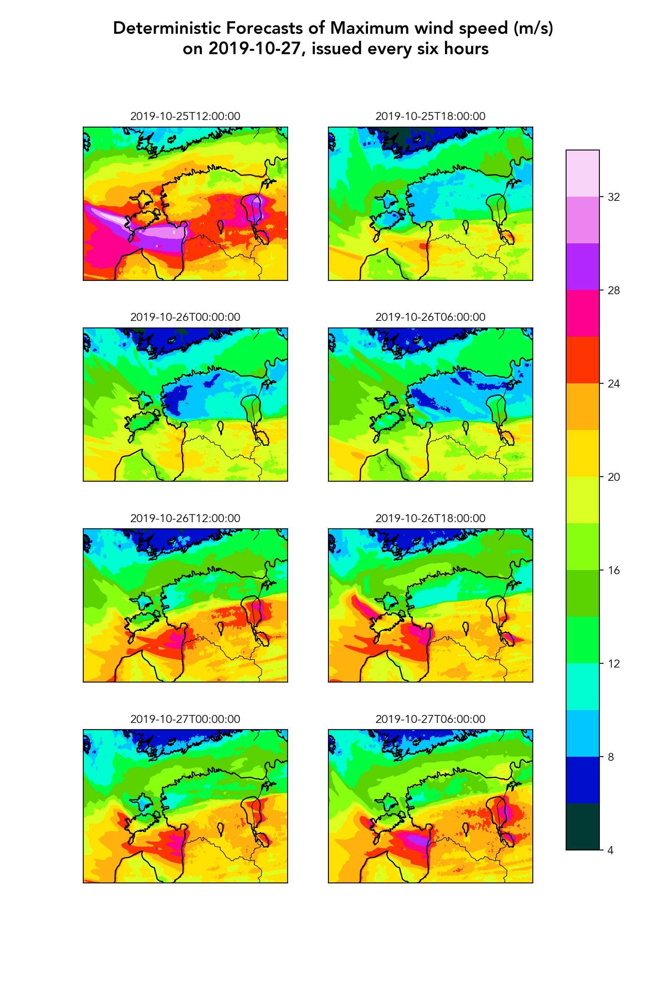

In [13]:
wgust_files = sorted(glob.glob("wgust*nc"))
levels=range(4,36,2)
fig=plt.figure(figsize=(8,12))
columns = 2
rows = 4
ax = []
for i,file in enumerate(wgust_files):
    ax.append(fig.add_subplot(rows, columns, i+1))
    ftemp = xr.open_dataset(file)
    a = ftemp.wind_speed_of_gust.isel(ensemble_member=0, height3=0).max(axis=0)
    X,Y = m(ftemp.longitude.data, ftemp.latitude.data)
    ppp2 = m.contourf(X,Y,a,levels=levels, cmap=plt.cm.gist_ncar)
    ax[-1].set_title(date_from_wgust_name(file),fontsize=10) 

    m.drawcountries()
    m.drawcoastlines()
ttl = fig.suptitle('Deterministic Forecasts of Maximum wind speed (m/s)\n on 2019-10-27, issued every six hours', fontsize=15,fontweight='bold',x=0.5)    
fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
fig.colorbar(ppp2, cax=cbar_ax)
plt.show()
#plt.savefig('wgust_zerombr.png',dpi=300,bbox_inches='tight')    

Now we plot 10 ensemble members of maximum forecasted wind speeds for each forecast run. We can see that on each forecast run at least some members showed dangerously strong wind gusts. However, maximum might not be the best way to find out what will happen, on next two cells we will look into mean and median values as well.

<IPython.core.display.Javascript object>


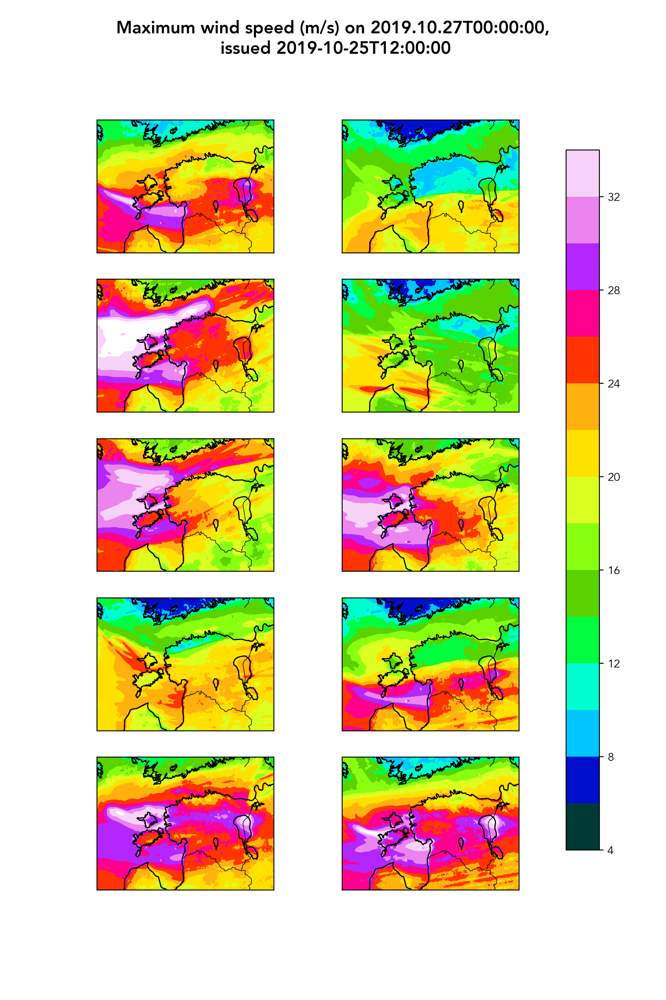

<IPython.core.display.Javascript object>


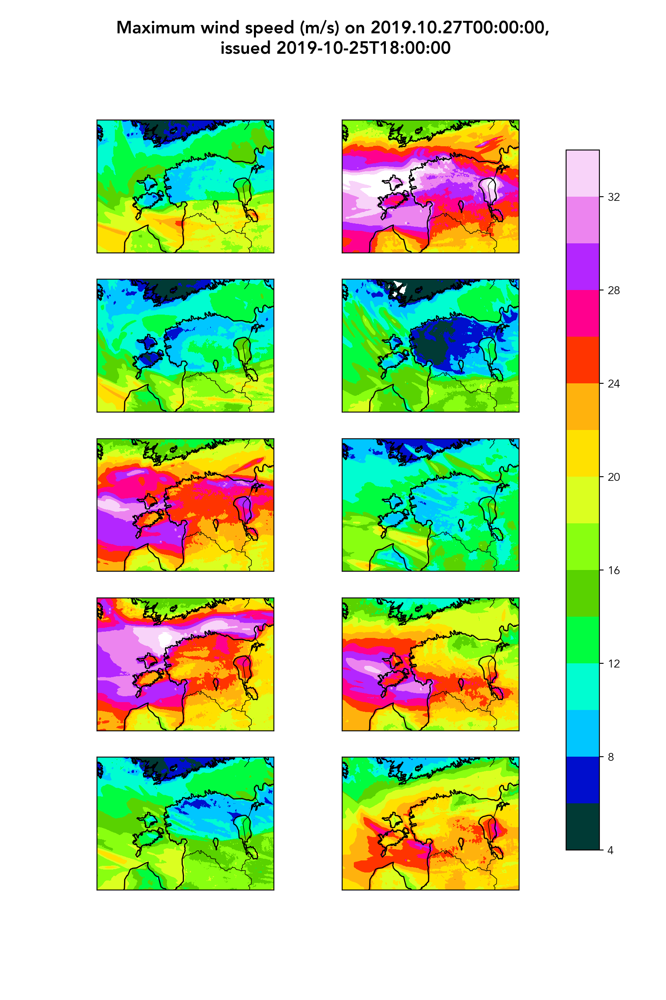

<IPython.core.display.Javascript object>


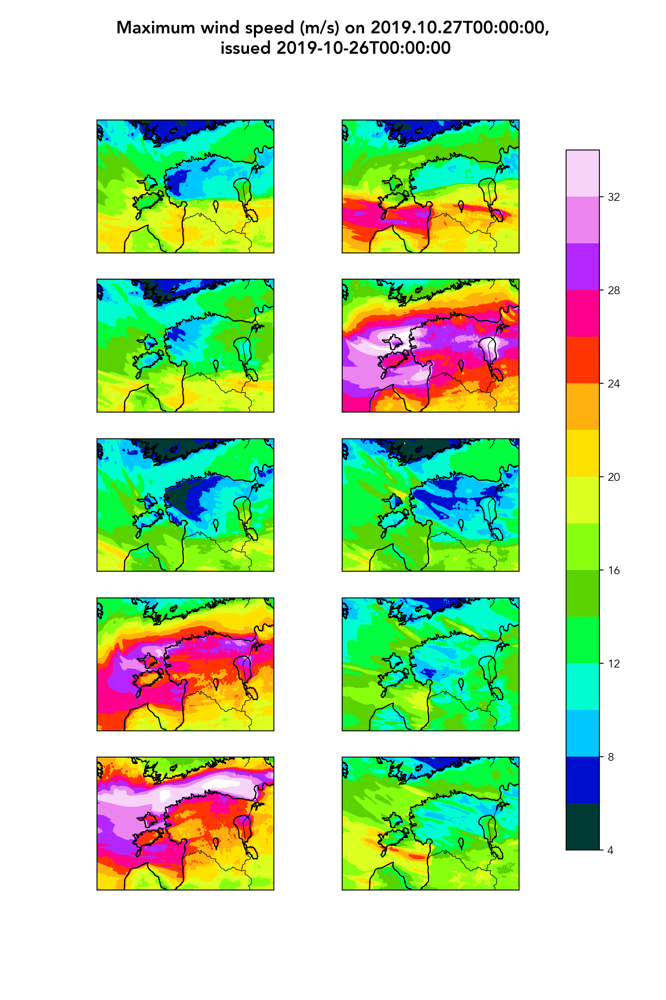

<IPython.core.display.Javascript object>


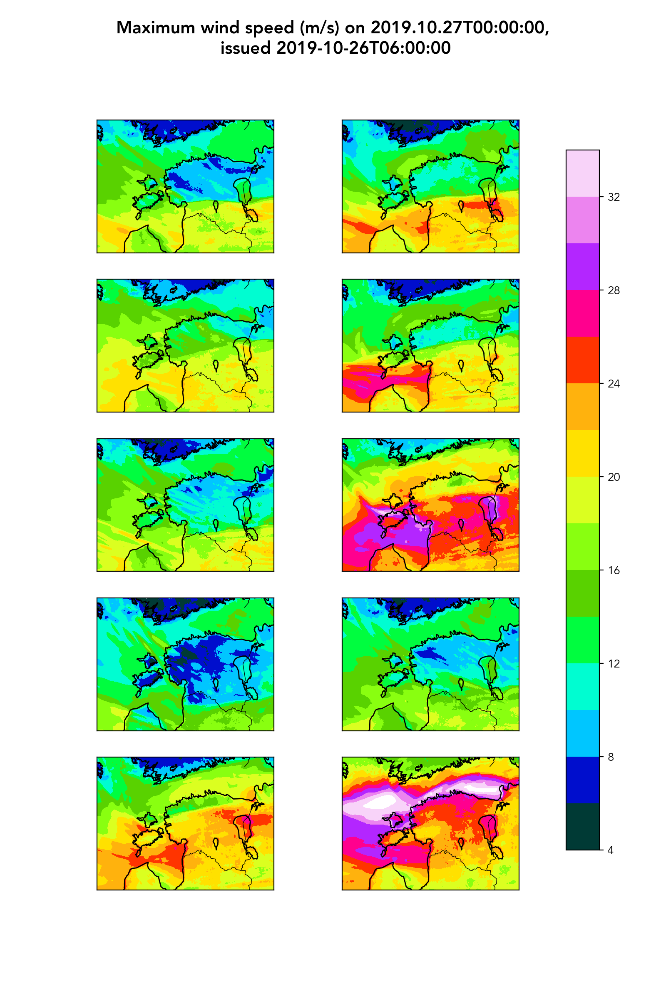

<IPython.core.display.Javascript object>


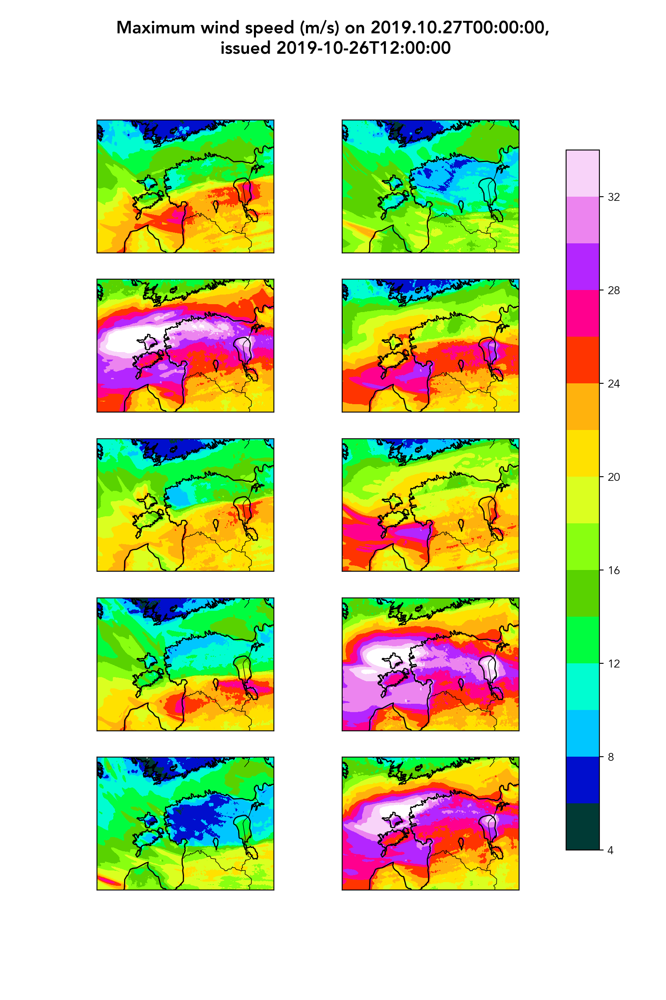

<IPython.core.display.Javascript object>


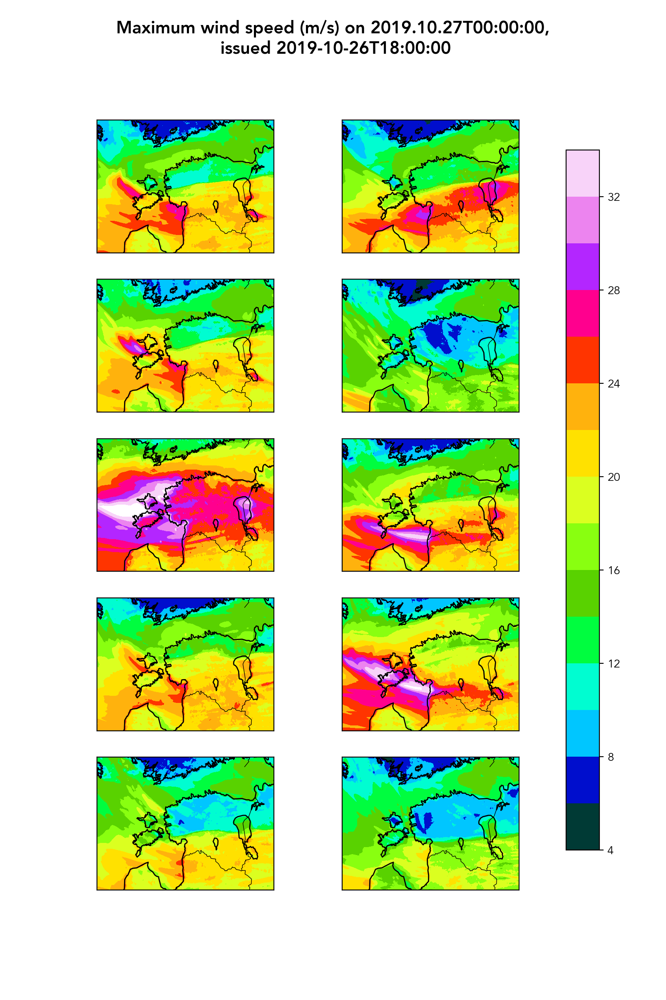

<IPython.core.display.Javascript object>


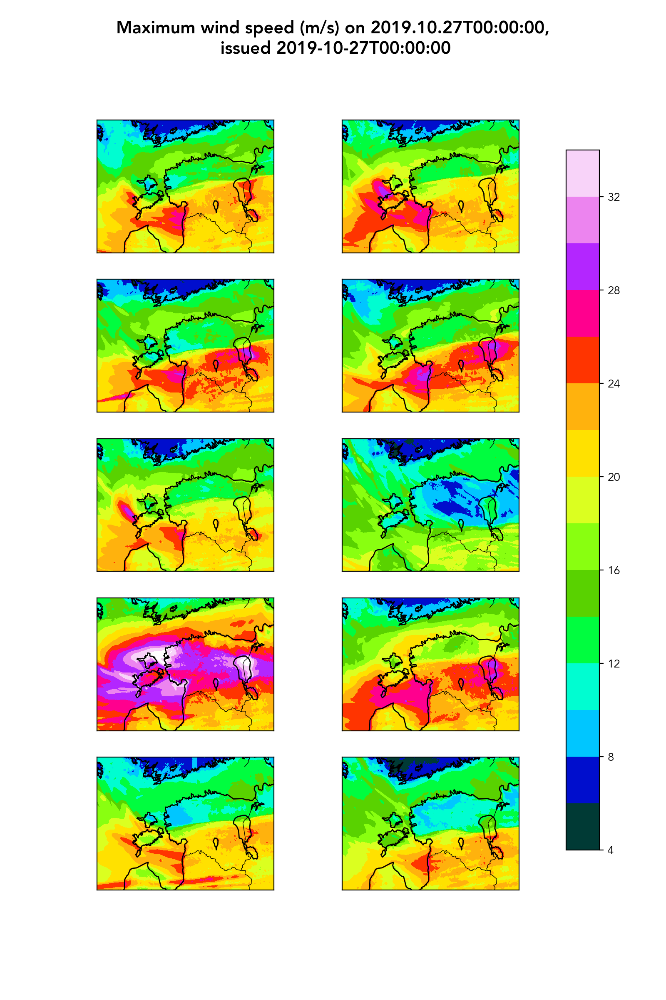

<IPython.core.display.Javascript object>


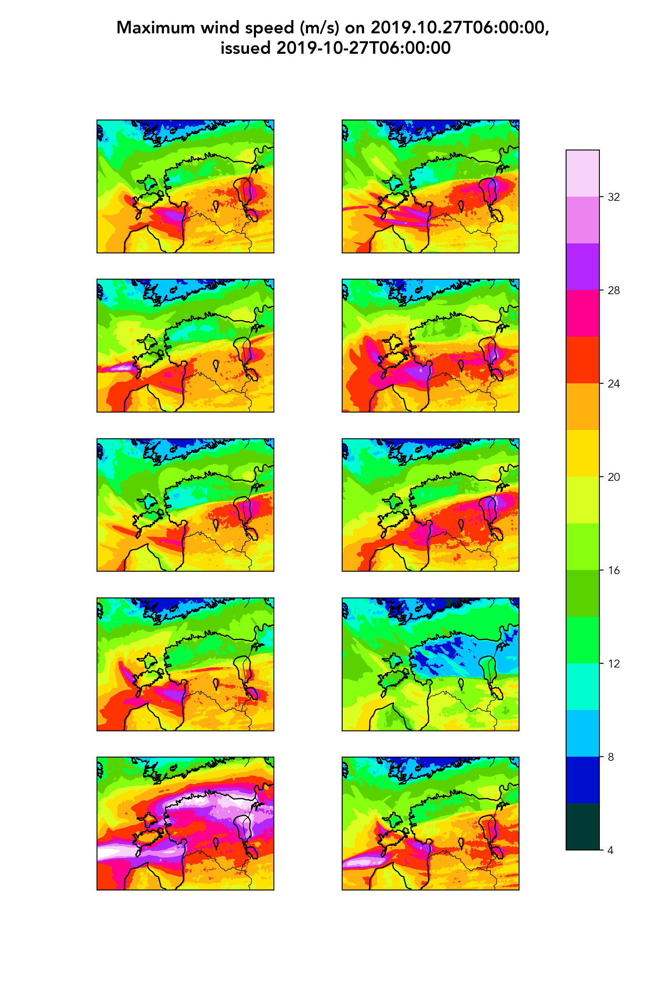

In [14]:
for file in wgust_files:
    ffl = xr.open_dataset(file)
    fig=plt.figure(figsize=(8,12))
    columns = 2
    rows = 5
    levels=range(4,36,2)
    X,Y = m(ftemp.longitude.data, ftemp.latitude.data)
    enss = np.arange(0,10,1)
    ax = []
    for ens in enss:
        ax.append(fig.add_subplot(rows, columns, ens+1 ))
        gust = ffl.wind_speed_of_gust.sel(height3=10).sel(ensemble_member=ens)
        ppp = m.contourf(X,Y,np.amax(gust[:,:,:], axis=0),levels=levels, cmap=plt.cm.gist_ncar)
        m.drawcountries()
        m.drawcoastlines()
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
    fig.colorbar(ppp, cax=cbar_ax)
    ttl = fig.suptitle('Maximum wind speed (m/s) on {0},\n issued {1}'.format(tformat(ffl.time[0]),date_from_wgust_name(file)), fontsize=15,fontweight='bold',x=0.5)    
    plt.show()
    #plt.savefig(file[:-3] +'_ansamblid.png',dpi=300,bbox_inches='tight')

In the next graph, we plotted the mean values of the ensemble. Zero member forecasts the strongest winds, however, on the most of the members, strong winds on southern Estonia are evident. 

<IPython.core.display.Javascript object>


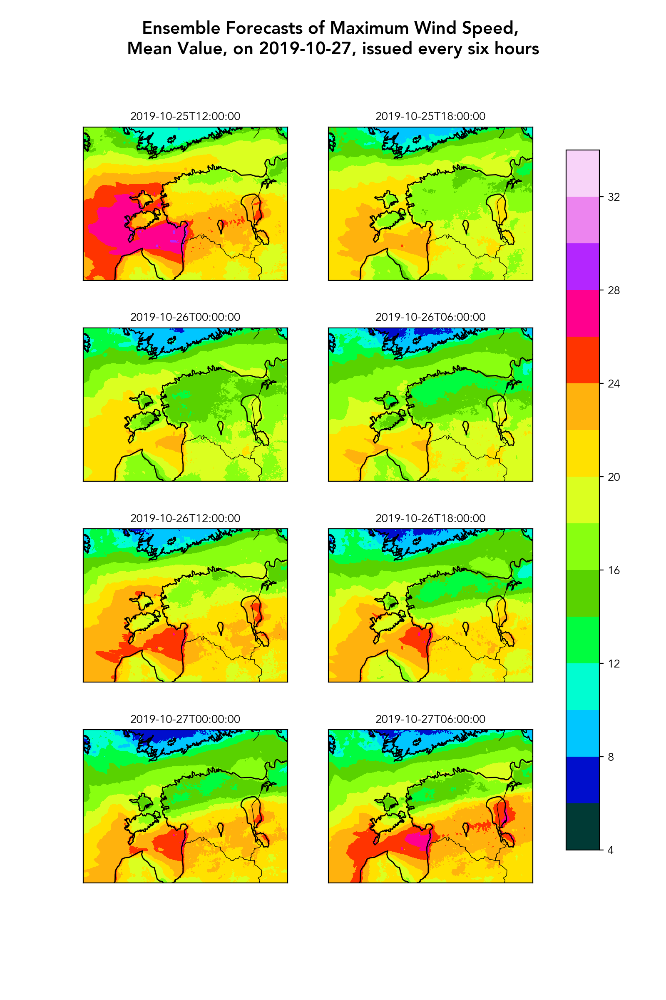

In [15]:
levels=range(4,36,2)
fig=plt.figure(figsize=(8,12))
columns = 2
rows = 4
ax = []
for i,file in enumerate(wgust_files):
    ax.append(fig.add_subplot(rows, columns, i+1))
    ffl = xr.open_dataset(file)
    a = np.mean(np.amax(ffl.wind_speed_of_gust.sel(height3=10),axis=0),axis=0)
    X,Y = m(ftemp.longitude.data, ftemp.latitude.data)
    ppp2 = m.contourf(X,Y,a,levels=levels, cmap=plt.cm.gist_ncar)
    ax[-1].set_title(date_from_wgust_name(file),fontsize=10) 

    m.drawcountries()
    m.drawcoastlines()

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
fig.colorbar(ppp2, cax=cbar_ax)
ttl = fig.suptitle('Ensemble Forecasts of Maximum Wind Speed, \nMean Value, on 2019-10-27, issued every six hours'.format(tformat(ffl.time[0]),date_from_wgust_name(file)), fontsize=15,fontweight='bold',x=0.5)    
plt.show()
# plt.savefig('wgust_meanmax.png',dpi=300,bbox_inches='tight')    


In the next graph, we plotted the median values of the ensemble. It is evident that the differences between subsequent forecasts are not as drastic as when we look at the control member alone. Similarly to the deterministic forecast, we see that wind speeds are lower, especially over the sea. However strong winds in South-Eastern Estonia do remain.

<IPython.core.display.Javascript object>


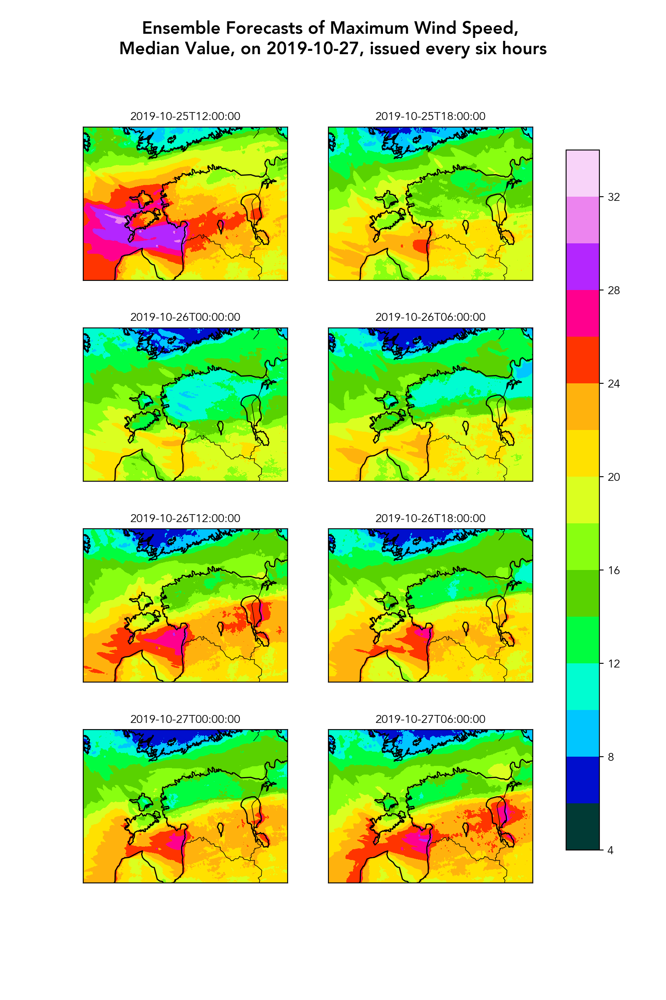

In [16]:
levels=range(4,36,2)
fig=plt.figure(figsize=(8,12))
columns = 2
rows = 4
ax = []
for i,file in enumerate(wgust_files):
    ax.append(fig.add_subplot(rows, columns, i+1))
    ffl = xr.open_dataset(file)
    a = np.median(np.amax(ffl.wind_speed_of_gust.sel(height3=10),axis=0),axis=0)
    X,Y = m(ffl.longitude.data, ffl.latitude.data)
    ppp2 = m.contourf(X,Y,a,levels=levels, cmap=plt.cm.gist_ncar)
    ax[-1].set_title(date_from_wgust_name(file),fontsize=10) 

    m.drawcountries()
    m.drawcoastlines()

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
fig.colorbar(ppp2, cax=cbar_ax)
ttl = fig.suptitle('Ensemble Forecasts of Maximum Wind Speed, \nMedian Value, on 2019-10-27, issued every six hours'.format(tformat(ffl.time[0]),date_from_wgust_name(file)), fontsize=15,fontweight='bold',x=0.5)    
plt.show()
#plt.savefig('wgust_medianmax.png',dpi=300,bbox_inches='tight')    


The next question we might ask is whether the ensemble median is the best way to express the statistical information that the ensemble itself contains. So let’s look at the ensemble forecasts with actual distribution, given for weather stations. We also display actual observed values and deterministic forecasts on the plots as well.

In [17]:
%%time
wdata = xr.open_dataset('wgust_25_12.nc')
def find_station_rect(longi, lati, rad=10):
    y,x = np.unravel_index(
        np.argmin(
            np.sqrt(
                (wdata.longitude.data-longi)**2 + (wdata.latitude.data-lati)**2)), 
                           wdata.latitude.data.shape)
    return slice(x-rad,x+rad), slice(y-rad,y+rad)

timerange = slice('2019-10-27T00:00:00', '2019-10-28T00:00:00', None)
wsg = []
obs = []
sts = []
station_name_fix = {'Johvi':'Jõhvi','Turi':'Türi','Vaike-Maarja':'Väike-Maarja','Jogeva':'Jõgeva','Sorve':'Sõrve','Pjarnu':'Pärnu','Voru':'Võru'}
for i in sorted(st_pandas_2.keys()):
    longi, lati = stations_clean[i]['SpatialExtent']['coordinates']
    selx, sely = find_station_rect(longi, lati)
    stat = st_pandas_2[i]['station_name'][0].title()
    if stat in station_name_fix:
        stat = station_name_fix[stat]
    sts.append(stat)
    obs.append(obs_dict[i])

CPU times: user 482 ms, sys: 50 ms, total: 532 ms
Wall time: 140 ms


These boxplots below show the spread of ensemble forecasts for different weather stations. The boxes show lower and upper quartiles, with all members given in the full range. If some ensemble members deviate significantly from others, they are shown as small rings. Deterministic forecast is given as straight line and actual observations as stars. 

Due to their proximity to the locations that suffered most damage in the October storms, we are most interested in the Valga and Võru stations.  We can see that on all of the three forecast lead times, the ensemble spread is small for these stations and that the ensemble median is always above the 20 m/s value. 


<IPython.core.display.Javascript object>


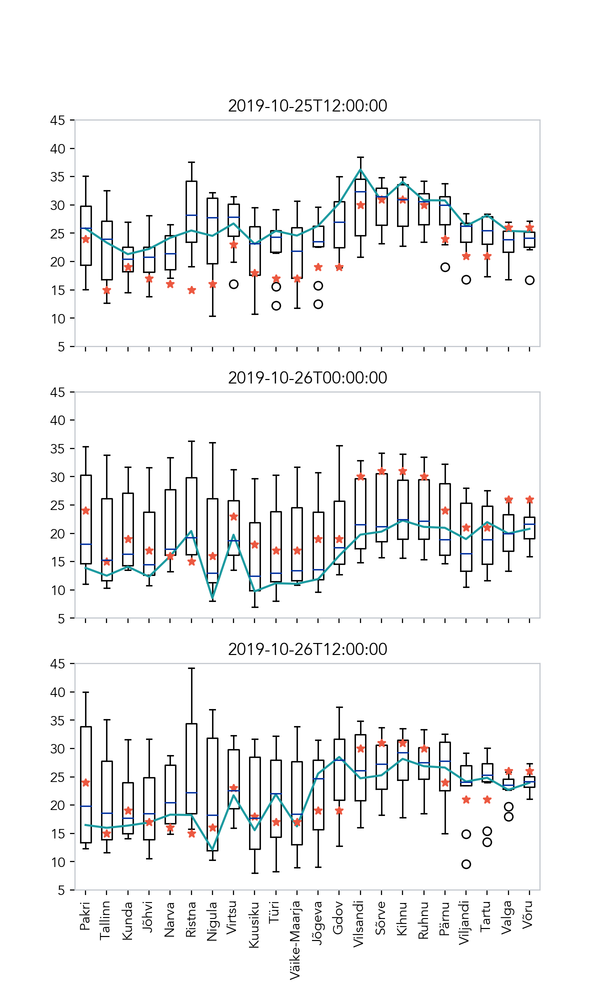

In [18]:
needed_stats = ['wgust_25_12.nc','wgust_26_00.nc','wgust_26_12.nc']

fig=plt.figure(figsize=(6, 10))
columns = 1
rows = 3
ax = []
for i_file,fl in enumerate(sorted(needed_stats)):
    ax1 = fig.add_subplot(rows, columns, i_file+1)
    ax.append(ax1)
    ax[-1].set_title(date_from_wgust_name(fl))
    wds = xr.open_dataset(fl)
    wdata = wds.wind_speed_of_gust
    wsg = []
    for i in sorted(st_pandas_2.keys()):
        longi, lati = stations_clean[i]['SpatialExtent']['coordinates']
        selx, sely = find_station_rect(longi, lati, rad=5)
        wsg.append(wdata.isel(x=selx, y=sely).max(axis=0).max(axis=0).max(axis=1).max(axis=1).data)
    zerombr = [i[0] for i in wsg]
    plt.ylim(5,45)
    plt.boxplot(wsg,medianprops=dict(color='#0030A0'))
    plt.xticks(np.arange(1, len(sts)+1), sts, rotation='vertical')
    plt.plot(np.arange(1,len(sts)+1), zerombr, label='null-liige',c='#1B9AA0')
    plt.plot(np.arange(1, len(sts)+1), obs, "*", label='mõõtmised',c='#EC5840')

    
    ax1.spines['bottom'].set_color('#C3C8CE')
    ax1.spines['top'].set_color('#C3C8CE')
    ax1.spines['left'].set_color('#C3C8CE')
    ax1.spines['right'].set_color('#C3C8CE')
    if not i_file == 2:
        ax1.set_xticklabels([])
plt.show()        
#plt.savefig('boxplot_combo.png',dpi=300,bbox_inches='tight') 

Getting data only for desired stations. 

In [19]:
interestings = {'26247':[], '26249':[], '26233':[]}
station_names = {i:st_pandas_2[i]['station_name'][0] for i in st_pandas_2.keys()}
zero_mbr = {'26247':[], '26249':[], '26233':[]}
forecast_times=[]
for fl in sorted(glob.glob("wgust*nc")):
    wds = xr.open_dataset(fl)
    wdata = wds.wind_speed_of_gust
    wsg = []
    for i in interestings.keys():
        longi, lati = stations_clean[i]['SpatialExtent']['coordinates']
        selx, sely = find_station_rect(longi, lati, rad=5)
        interestings[i].append(wdata.isel(x=selx, y=sely).max(axis=0).max(axis=0).max(axis=1).max(axis=1).data)
        zero_mbr[i].append(wdata.isel(ensemble_member=0,x=selx, y=sely).max().data)
    forecast_times.append(fl[6:11].replace('_',':'))

Below we can see the ensemble forecasts for station Valga, Võru and Viljandi from different forecast times. The red line is the real-time observation, blue line is deterministic forecast and boxes are the ensemble spread. In each of the forecasts, the median value of the maximum wind speed was above 20 m/s. It is also apparent that the deterministic forecasts show a sharper decline in the Friday evening and Saturday morning forecasts, leading to the possibility of false storm weakening signals.

<IPython.core.display.Javascript object>


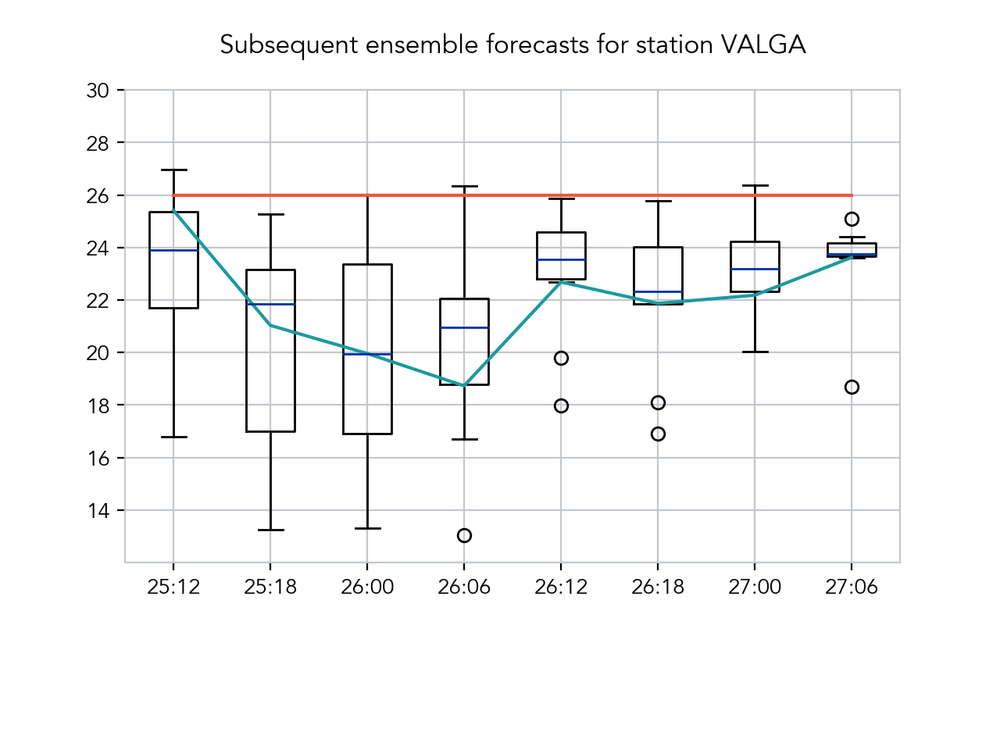

VALGA_max.png


<IPython.core.display.Javascript object>


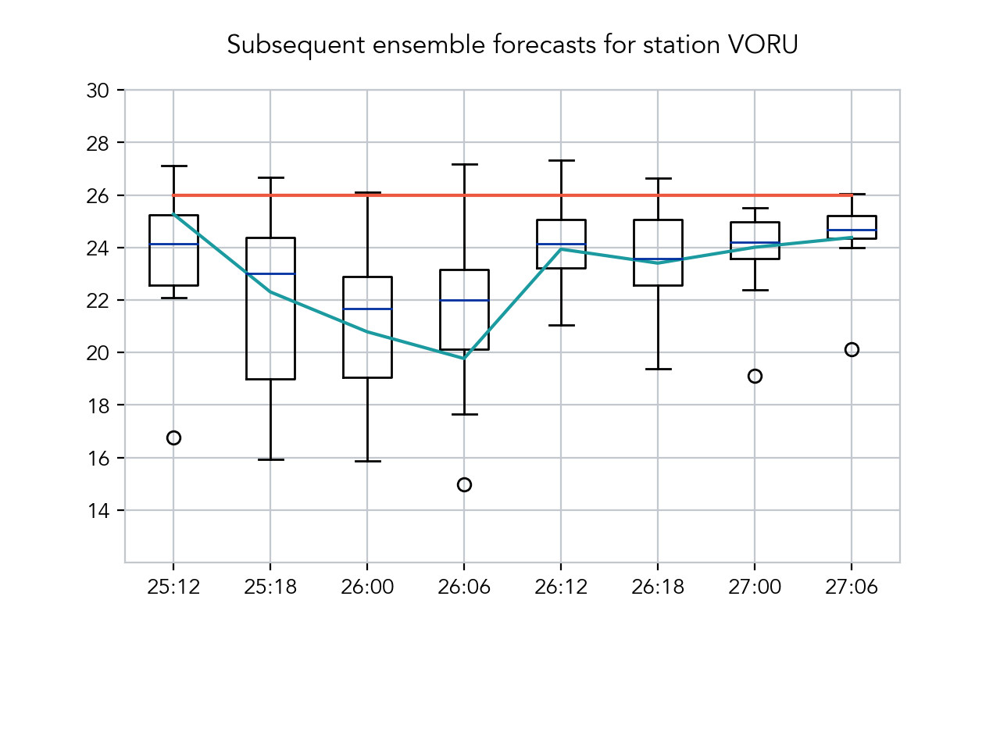

VORU_max.png


<IPython.core.display.Javascript object>


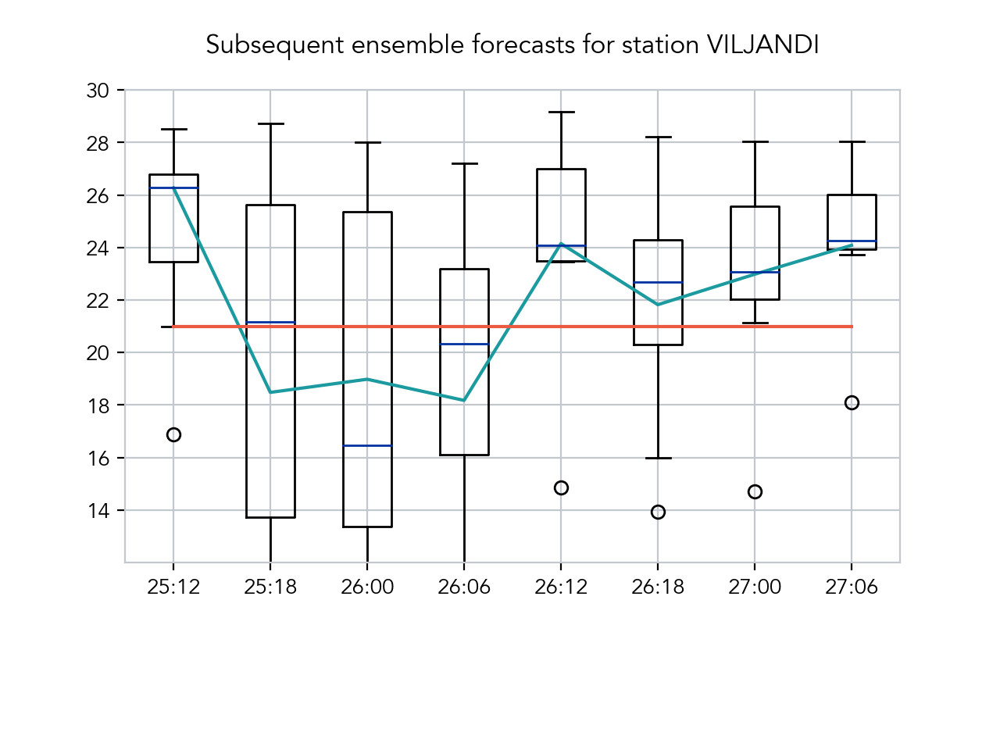

VILJANDI_max.png


In [20]:
for station in interestings.keys():
    jaam = station_names[station]
    observs = [obs_dict[station] for i in range(8)]
    fig = plt.figure()
    ax1 = fig.add_subplot(111)
    
    plt.ylim(12,30)
    plt.yticks(np.arange(14,32, 2))
    plt.boxplot(interestings[station],medianprops=dict(color='#0030A0'))
    plt.plot(np.arange(1,9),zero_mbr[station], c='#1B9AA0', label='K-prog')
    plt.plot(np.arange(1,9),observs, c='#EC5840',label="Mõõdetud")
    plt.xticks(np.arange(1,9), forecast_times)
    plt.subplots_adjust(bottom=0.25)
    plt.grid(color='#C3C8CE',alpha=1)
    
    ax1.spines['bottom'].set_color('#C3C8CE')
    ax1.spines['top'].set_color('#C3C8CE')
    ax1.spines['left'].set_color('#C3C8CE')
    ax1.spines['right'].set_color('#C3C8CE')
    
    ttl = plt.title("Subsequent ensemble forecasts for station {}".format(jaam))
    ttl.set_position([.5, 1.05])
    #plt.legend(loc=9, bbox_to_anchor=(0.5, -0.06), ncol=2,frameon=False)
    print (jaam + '_max.png')
    plt.show()
    #plt.savefig(jaam + '_max.png',dpi=300,bbox_inches='tight') 


We have shown that in case of extreme weather situations, using ensemble forecast systems can improve our understanding of the probabilities of emergency weather patterns. However, translating the probabilities shown in forecasts into accessible weather advisories that are distributed to the public is integral for proactive disaster preparedness and response.  These  efforts are far from trivial and important for raising awareness. Although, work is still left to be done in creating efficient mechanisms for integrating these forecasts into structured responses.